every run in this notebook has

• ridge max height of 0.3 island max height

• resolution=(64x64)

but we run through 8 cases wrt to the general geometry

• case1: Ro = 17, Rs=12, steep=0.2, W=$\pi$/5 

• case2: Ro = 17, Rs=12, steep=0.2, W=$\pi$/6 

• case3: Ro = 17, Rs=14, steep=0.2, W=$\pi$/5 

• case4: Ro = 17, Rs=14, steep=0.2, W=$\pi$/6

• case5: Ro = 20, Rs=12, steep=0.1, W=$\pi$/5 

• case6: Ro = 20, Rs=12, steep=0.1, W=$\pi$/6 

• case7: Ro = 20, Rs=14, steep=0.1, W=$\pi$/5 

• case8: Ro = 20, Rs=14, steep=0.1, W=$\pi$/6


There will be two methods of classification (i) by eye (needed for mode analysis anyway) and (ii) using the percentage of kinetic energy on the ridge vs off the ridge between r=1 and r=Rs

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import dedalus.public as d3
import logging
logger = logging.getLogger(__name__)
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
mpl.rc('text', usetex = True)
mpl.rc('font', family = 'serif')
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rcParams.update({'font.size': 18})


In [2]:
import xarray as xr

In [3]:
from dedalus.core.operators import SpectralOperator1D

class ComplexFourierPseudodifferential(SpectralOperator1D):

    input_basis_type = d3.ComplexFourier
    subaxis_dependence = [True]
    subaxis_coupling = [False]

    def __init__(self, operand, coord, out=None):
        super().__init__(operand, out=out)
        # SpectralOperator requirements
        self.coord = coord
        self.input_basis = operand.domain.get_basis(coord)
        self.output_basis = self.input_basis
        self.first_axis = coord.axis
        self.last_axis = coord.axis
        self.axis = coord.axis
        # LinearOperator requirements
        self.operand = operand
        # FutureField requirements
        self.domain = operand.domain.substitute_basis(self.input_basis, self.output_basis)
        self.tensorsig = operand.tensorsig
        self.dtype = operand.dtype

    @classmethod
    def _group_matrix(cls, group, input_basis, output_basis):
        # Rescale group (native wavenumber) to get physical wavenumber
        k = group / input_basis.COV.stretch
        # dx exp(1j*k*x) = 1j * k * exp(1j*k*x)
        return np.array([[cls.k_func(k)]])


class abs_m_cls(ComplexFourierPseudodifferential):

    name = "abs_m"

    @classmethod
    def k_func(cls, k):
        return abs(k)

    def new_operand(self, operand, **kw):
        if operand == 0:
            return 0
        return abs_m_cls(operand,  self.coord, **kw)

In [4]:
def kinetic_energy(Φg,r,θ):
    dΦ_dr = np.gradient(Φg,r,axis=1)
    dΦ_dθ = 1/r*np.gradient(Φg,np.gradient(θ)[0],axis=0)
    gradΦ = dΦ_dr + dΦ_dθ
    ke = gradΦ*np.conj(gradΦ) 
    ke = xr.DataArray(ke.real, coords=[θ,r], dims = ['theta','r']) 
    return ke

def kinetic_energy_metric(ke,Rs):
    ridge_wedge = ke.where(ke.theta<np.pi+W).where(ke.theta>np.pi-W).sum('theta')
    basin_wedge = ke.where(ke.theta>np.pi+W).fillna(0)+ke.where(ke.theta<np.pi-W).fillna(0); 
    basin_wedge = basin_wedge.where(np.abs(basin_wedge>0)).sum('theta')
    metric = (ridge_wedge/(ridge_wedge+basin_wedge)).sel(r=slice(1,Rs))
    weights = np.gradient(metric.r)/sum(np.gradient(metric.r))
    metric = float((metric*weights).sum('r').values)
    return metric

def eigenmode_plot(i,R,THETA):
    fig,(ax,ax2,ax1) = plt.subplots(1,3, figsize=(14,4),gridspec_kw={'width_ratios': [1.3,1.3,2]})    
    X = R*np.cos(THETA); Y=R*np.sin(THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g']
    Φg = (Φg-np.mean(Φg, axis=0))
    vmax=np.max(np.abs(Φg))*0.75;vmin=-vmax
    ax.pcolormesh(X,Y,Φg.real, vmin=vmin,vmax=vmax)
    ax.contour(X,Y,H, levels=[0.99,1], colors='k', alpha=0.5)
    vmax=np.max(np.abs(Φg[:,:int(Nr/8)]))*0.75;vmax=max(vmax,0.2);vmin=-vmax
    ax2.pcolormesh(X[:,:int(Nr/6)],Y[:,:int(Nr/6)],Φg.real[:,:int(Nr/6)], vmin=vmin,vmax=vmax)
    ax2.contour(X[:,:int(Nr/6)],Y[:,:int(Nr/6)],H[:,:int(Nr/6)], levels=[0.99,1], colors='k', alpha=0.5)
    for j in range(Nθ):
        ax1.plot(r, Φg.real[j,:], 'k', alpha=0.5)
        ax1.axhline(0,color='k',linestyle='dashed')
    ax.set_ylabel(r'$\omega = $ %5.4f'%(1/solver.eigenvalues.real[i]))
    ax1.set_xlabel('$r$'); ax1.set_ylabel(r'$\Phi(r,\theta)$');
    ax.set_xticks([]);ax.set_yticks([]);ax2.set_xticks([]);ax2.set_yticks([])
    fig.tight_layout()
    plt.show()

# Case \#1

Ro,Rs: 17,12

W:$\pi$/5

steep:0.2

In [5]:
## variable parameters ##
Ro = 17;
Rs = 12;
Nθ = 64;
Nr = 64;
W = np.pi/5; 
frac = 0.3;
steep = 0.2;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1-1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [6]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 16:08:27,441 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 21s, Remaining: 0s, Rate: 3.8e-03/s
CPU times: user 3min 23s, sys: 57.8 s, total: 4min 21s
Wall time: 4min 42s


In [7]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [8]:
case1_eigenvalues = 1/solver.eigenvalues.real

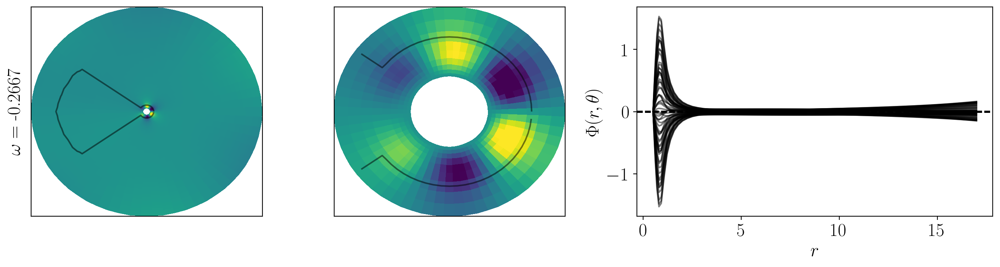

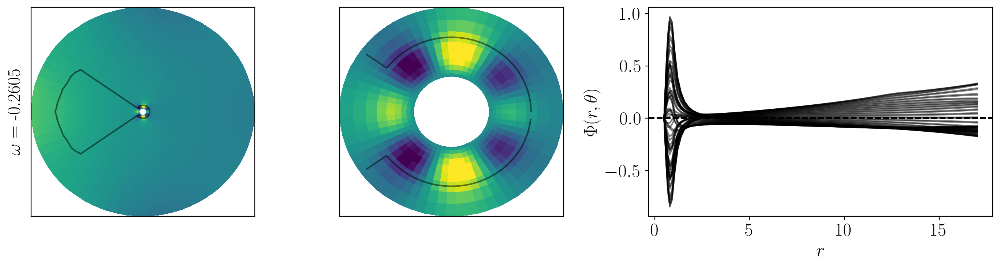

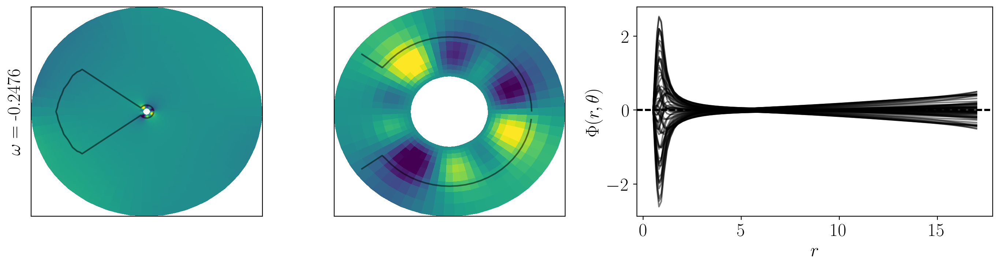

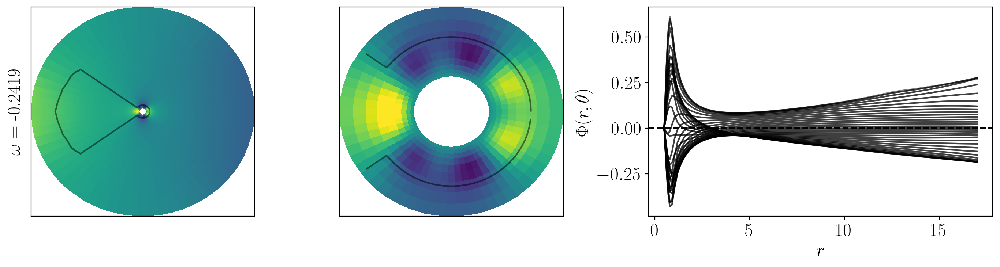

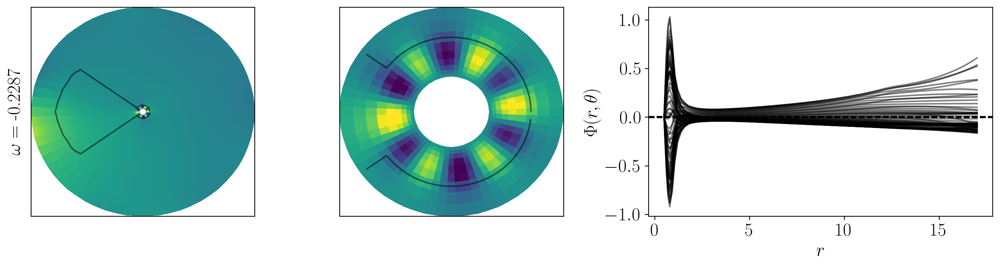

...

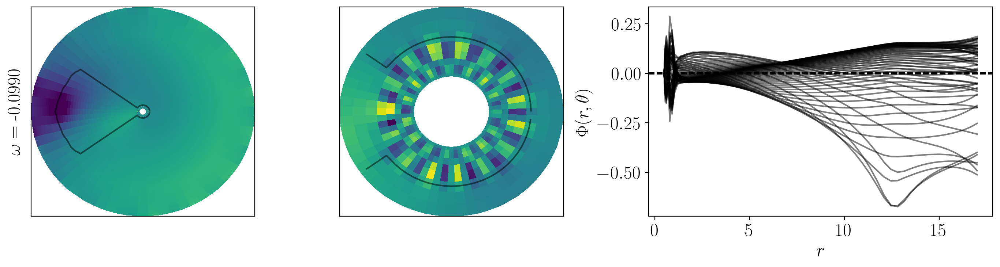

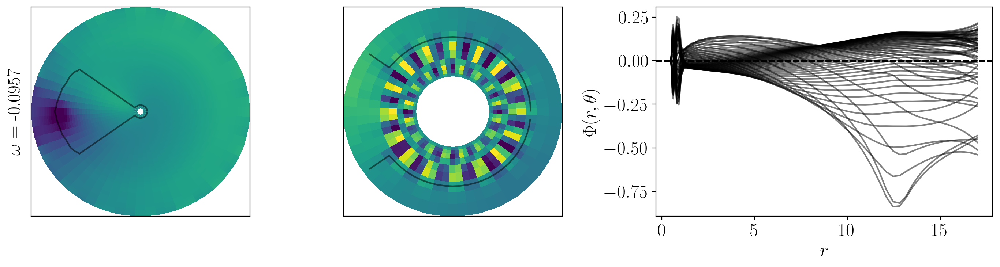

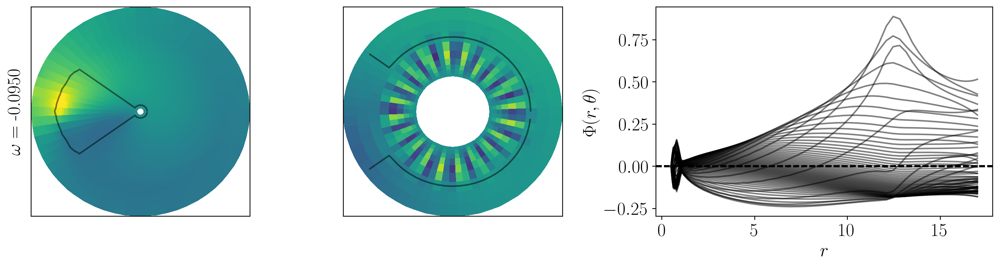

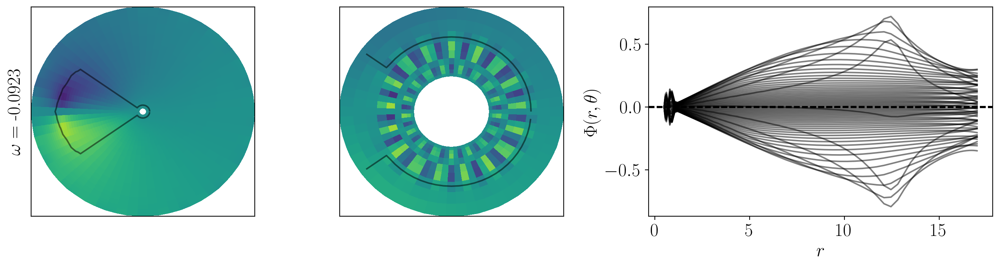

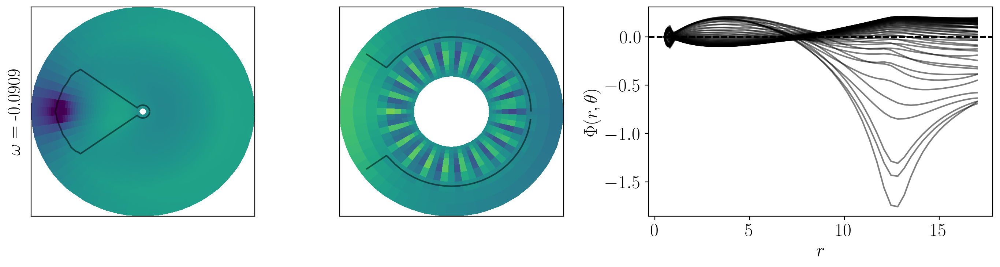

In [9]:
case1_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case1_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#2


Ro,Rs: 17,12


W:$\pi$/6

steep:0.2

In [10]:
## variable parameters ##
Ro = 17;
Rs = 12;
Nθ = 64;
Nr = 64;
W = np.pi/6; 
frac = 0.3;
steep = 0.2;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [11]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 16:13:22,912 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 21s, Remaining: 0s, Rate: 3.8e-03/s
CPU times: user 3min 24s, sys: 57.1 s, total: 4min 21s
Wall time: 4min 42s


In [12]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [13]:
case2_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case2_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case2_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#3


Ro,Rs: 17,14 

W:$\pi$/5

steep:0.2 

In [15]:
## variable parameters ##
Ro = 17;
Rs = 14;
Nθ = 64;
Nr = 64;
W = np.pi/5; 
frac = 0.3;
steep = 0.2;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [16]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 16:18:13,307 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 17s, Remaining: 0s, Rate: 3.9e-03/s
CPU times: user 3min 21s, sys: 53.9 s, total: 4min 15s
Wall time: 4min 38s


In [17]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [18]:
case3_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case3_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case3_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#4

Ro,Rs: 17,14 

W:$\pi$/6

steep:0.2 

In [20]:
## variable parameters ##
Ro = 17;
Rs = 14; 
Nθ = 64;
Nr = 64;
W = np.pi/6; 
frac = 0.3;
steep = 0.2;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [21]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 16:23:16,690 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 30s, Remaining: 0s, Rate: 3.7e-03/s
CPU times: user 3min 24s, sys: 1min, total: 4min 24s
Wall time: 4min 51s


In [22]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [23]:
case4_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case4_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case4_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#5


Ro,Rs: 20,12 

W:$\pi$/5

steep:0.1 

In [25]:
## variable parameters ##
Ro = 20;
Rs = 12;
Nθ = 64;
Nr = 64;
W = np.pi/5; 
frac = 0.3;
steep = 0.1;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;


#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [26]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 16:28:20,090 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 30s, Remaining: 0s, Rate: 3.7e-03/s
CPU times: user 3min 23s, sys: 59.2 s, total: 4min 23s
Wall time: 4min 51s


In [27]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [28]:
case5_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case5_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case5_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#6


Ro,Rs: 20,12 


W:$\pi$/6

steep:0.1 

In [30]:
## variable parameters ##
Ro = 20;
Rs = 12;
Nθ = 64;
Nr = 64;
W = np.pi/6; 
frac = 0.3;
steep = 0.1;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [31]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 16:33:21,886 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 28s, Remaining: 0s, Rate: 3.7e-03/s
CPU times: user 3min 23s, sys: 1min, total: 4min 23s
Wall time: 4min 49s


In [32]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [33]:
case6_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case6_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case6_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#7

Ro,Rs: 20,14 

W:$\pi$/5

steep:0.1 

In [35]:
## variable parameters ##
Ro = 20;
Rs = 14;
Nθ = 64;
Nr = 64;
W = np.pi/5; 
frac = 0.3;
steep = 0.1;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [36]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 16:38:40,702 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 45s, Remaining: 0s, Rate: 3.5e-03/s
CPU times: user 3min 25s, sys: 1min 7s, total: 4min 32s
Wall time: 5min 6s


In [37]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [38]:
case7_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case7_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case7_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

# Case \#8


Ro,Rs: 20,14 


W:$\pi$/6

steep:0.1 

In [40]:
## variable parameters ##
Ro = 20;
Rs = 14;
Nθ = 64;
Nr = 64;
W = np.pi/6; 
frac = 0.3;
steep = 0.1;

plot_option = False;
##########################


## fixed and dependent parameters 
Ri= 0.5;
α = 1 
Hmin_island = Ri**(2*α);
Hmin_ridge = 1-(1-Hmin_island)*frac; 
b = -np.log(Hmin_ridge)/(2*W)
C = np.pi;

#Basis
coords = d3.CartesianCoordinates('θ', 'r')
dist = d3.Distributor(coords, dtype=np.complex128)
θ_basis = d3.Fourier(coords['θ'], Nθ, (0, 2*np.pi), dtype=np.complex128)
r_basis = d3.Chebyshev(coords['r'], Nr, (Ri, Ro))
# Fields
Φ = dist.Field(name='Φ', bases=(θ_basis, r_basis))
tau1 = dist.Field(name='tau1', bases=θ_basis)
tau2 = dist.Field(name='tau2', bases=θ_basis)
ωinv = dist.Field(name='ωinv')

# Substitutions
dθ = lambda A: d3.Differentiate(A, coords['θ'])
dr = lambda A: d3.Differentiate(A, coords['r'])
θ, r = dist.local_grids(θ_basis, r_basis)

rinv = dist.Field(bases=r_basis); rinv['g'] = r**(-1)

lift_basis = r_basis.derivative_basis(2)
tau_terms = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
m_func = lambda m: abs(m)
abs_m = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

## bathymetry ##
R,THETA = np.meshgrid(r,θ)
Hisland = R**(2*α) 
Hisland[Hisland>1] = 1
Hridge = np.exp(2*b*(np.abs(C-THETA)-W))
Hridge[Hridge>1] = 1
Hridge[R>Rs] = Hridge[R>Rs]*np.exp(steep*(R[R>Rs]-Rs))
# Hridge[R>Rs] = 1
Hridge[Hridge>1] = 1
H = np.where(Hisland<Hridge,Hisland,Hridge)

## bathymetry as field ##
Hinv = dist.Field(bases=(θ_basis,r_basis))
Hinv['g'] = H**(-1)

if plot_option==True:
    ## plot bathymetry
    R,THETA = np.meshgrid(r,θ)
    x = R*np.cos(THETA); y=R*np.sin(THETA)
    fig,(ax) = plt.subplots(1,1, figsize=(7,7))
    c=ax.pcolormesh(x,y,1/Hinv['g'].real)
    ax.set_title(r'$H(r,\theta)/H(r\to\infty, \theta)$')
    cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
    cbar=plt.colorbar(c,cax = cax,orientation='vertical',shrink = 0.5)
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("Hinv*(dr(dr(Φ)) + rinv*dr(Φ) + rinv**2*dθ(dθ(Φ))) + dr(Φ)*dr(Hinv) + rinv**2*dθ(Φ)*dθ(Hinv) + 1j*rinv*ωinv*(dr(Φ)*dθ(Hinv) - dθ(Φ)*dr(Hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("dr(Φ)(r=Ro) + abs_m(Φ)(r=Ro) / Ro = 0") #outer BC


In [41]:
%%time
## solver (edit names with each run) ##
solver = problem.build_solver(matrix_coupling=(True,True))
solver.solve_sparse(solver.subproblems[0], 40,-1/0.3) 

2022-09-16 16:43:59,551 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 4m 45s, Remaining: 0s, Rate: 3.5e-03/s
CPU times: user 3min 25s, sys: 1min 5s, total: 4min 30s
Wall time: 5min 6s


In [42]:
# extract r and \theta dimensions in more easy forms for plotting
r = r[0]; θ = θ.T[0]

In [43]:
case8_eigenvalues = 1/solver.eigenvalues.real

In [ ]:
case8_ridge_metric = np.zeros(40)
for i in range(40):
    eigenmode_plot(i,R,THETA)
    solver.set_state(i, solver.subproblems[0].subsystems[0]) 
    Φg = Φ['g'];ke = kinetic_energy(Φg,r,θ)
    case8_ridge_metric[i] = kinetic_energy_metric(ke,Rs)

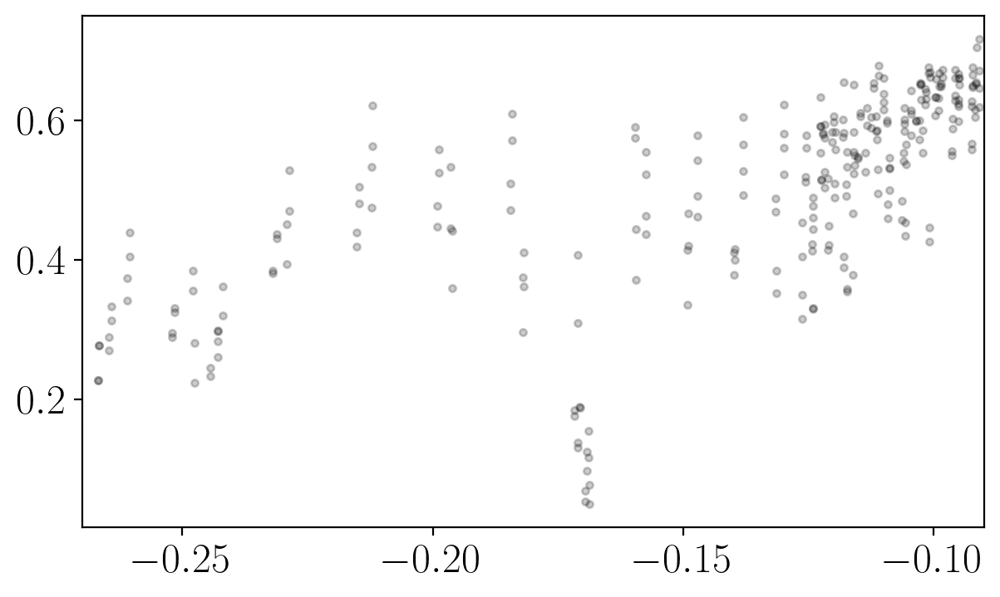

In [45]:
fig,(ax) = plt.subplots(1,1, figsize=(7,4))   
ax.plot(case1_eigenvalues, case1_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case2_eigenvalues, case2_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case3_eigenvalues, case3_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case4_eigenvalues, case4_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case5_eigenvalues, case5_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case6_eigenvalues, case6_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case7_eigenvalues, case7_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case8_eigenvalues, case8_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.set_xlim(-0.27,-0.09)
# ax.axvline(-0.1420, color='k', linestyle='dashed')
plt.show()

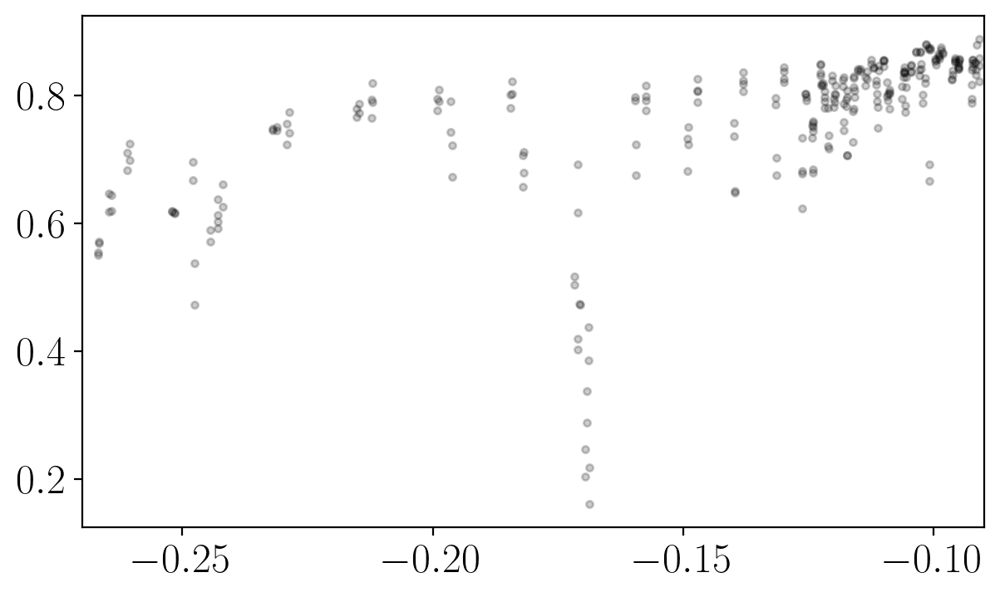

In [45]:
fig,(ax) = plt.subplots(1,1, figsize=(7,4))   
ax.plot(case1_eigenvalues, case1_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case2_eigenvalues, case2_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case3_eigenvalues, case3_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case4_eigenvalues, case4_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case5_eigenvalues, case5_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case6_eigenvalues, case6_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case7_eigenvalues, case7_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.plot(case8_eigenvalues, case8_ridge_metric, 'ko', markersize=3, alpha=0.2)
ax.set_xlim(-0.27,-0.09)
# ax.axvline(-0.1420, color='k', linestyle='dashed')
plt.show()

In [46]:
eigenvalues = np.concatenate([case1_eigenvalues,case2_eigenvalues,case3_eigenvalues,case4_eigenvalues,case5_eigenvalues,case6_eigenvalues,case7_eigenvalues,case8_eigenvalues])
ke_metric   = np.concatenate([case1_ridge_metric,case2_ridge_metric,case3_ridge_metric,case4_ridge_metric,case5_ridge_metric,case6_ridge_metric,case7_ridge_metric,case8_ridge_metric])
case        = np.concatenate([np.ones(40),np.ones(40)*2,np.ones(40)*3,np.ones(40)*4,np.ones(40)*5,np.ones(40)*6,np.ones(40)*7,np.ones(40)*8 ])

In [47]:
da_eigen = xr.DataArray(eigenvalues, coords=[np.arange(len(eigenvalues))], dims=['n_eigenvalue'])
da_metric = xr.DataArray(ke_metric, coords=[np.arange(len(eigenvalues))], dims=['n_eigenvalue'])
da_case = xr.DataArray(case, coords=[np.arange(len(eigenvalues))], dims=['n_eigenvalue'])


In [48]:
da_eigen.coords['case'] = da_case
da_metric.coords['case'] = da_case

In [49]:
ds = xr.Dataset({'eigenvalues':da_eigen, 'ke_metric':da_metric})

In [50]:
ds.attrs['description'] = 'ridge_frac = 0.3'

In [51]:
ds.to_netcdf('alt_combined_config_eigenvalues_ridgefrac03.nc')

In [ ]:
-0.266702565,-0.260461439,-0.247618129,-0.241858059,-0.247618129,-0.241858059,-0.228705929,-0.211986875,-0.19619096,-0.181820915,-0.169312819,-0.168814917,-0.168814917,-0.157429633,-0.147190793,-0.138056612,-0.12988719,-0.122557642,-0.121810172,-0.121001852,-0.119672619
3,4,5,2,5,2,6,7,8,9,1,10,1,11,12,13,14,15,7,8,9
1,1,1,1,1,1,1,1,1,1,1, 1,1, 1, 1, 1, 1, 1,2,2,2

-0.266859056,-0.260953364,-0.247904083,-0.242887161,-0.247904083,-0.242887161,-0.229195943,-0.212286555,-0.196385161,-0.181952516,-0.169657067,-0.1689375,-0.1689375,-0.157500324,-0.147246209,-0.138100195,-0.129921613,-0.12258661,-0.121825298,-0.121059148
3,4,5,2,5,2,6,7,8,9,1,10,1,11,12,13,14,15,7,8
1,1,1,1,1,1,1,1,1,1,1,1 ,1, 1, 1, 1, 1, 1,2,2

-0.266702204,-0.260462009,-0.247617619,-0.241856658,-0.247617619,-0.241856658,-0.228707479,-0.211987934,-0.196191699,-0.18182153,-0.169313704,-0.168815493,-0.168815493,-0.157430231,-0.147191424,-0.138057289,-0.129887903,-0.122558372,-0.121810212,-0.121001873
3,4,5,2,5,2,6,7,8,9,1,10,1,11,12,13,14,15,7,8
1,1,1,1,1,1,1,1,1,1,1, 1,1, 1, 1, 1, 1, 1,2,2

-0.266858667,-0.260953269,-0.247904206,-0.242884926,-0.247904206,-0.242884926,-0.229196497,-0.212287211,-0.196385739,-0.181953021,-0.169659094,-0.168937756,-0.168937756,-0.157500714,-0.147246599,-0.138100587,-0.129922012,-0.122587031,-0.121825308,-0.1210592
3,4,5,2,5,2,6,7,8,9,1,10,1,11,12,13,14,15,7,8
1,1,1,1,1,1,1,1,1,1,1,1 ,1, 1, 1, 1, 1, 1,2,2


-0.270851363,-0.264142117,-0.251566619,-0.242854271,-0.251566619,-0.242854271,-0.231093661,-0.214642452,-0.198721265,-0.184151588,-0.170701372,-0.171071952,-0.159395103,-0.149006287,-0.13974657,-0.13147352,-0.126323058,-0.125481955
3,4,5,2,5,2,6,7,8,9,1,10,11,12,13,14,7,8
1,1,1,1,1,1,1,1,1,1,1, 1, 1, 1, 1, 1,2,2

-0.27101622,-0.264714781,-0.251948538,-0.244431081,-0.251948538,-0.244431081,-0.231972414,-0.215147762,-0.199083357,-0.184442549,-0.171813213,-0.171134598,-0.159587537,-0.149170612,-0.139887852,-0.131599779,-0.126339907,-0.125537732
3,4,5,2,5,2,6,7,8,9,1,10,11,12,13,14,7,8
1,1,1,1,1,1,1,1,1,1,1, 1, 1, 1, 1, 1,2,2

-0.270850197,-0.264141021,-0.25156463,-0.242840548,-0.25156463,-0.242840548,-0.231094026,-0.214644197,-0.198722072,-0.184151566,-0.170643586,-0.17106909,-0.159395075,-0.14900644,-0.139746786,-0.13147367,-0.126323029,-0.125481953
3,4,5,2,5,2,6,7,8,9,1,10,11,12,13,14,7,8
1,1,1,1,1,1,1,1,1,1,1, 1, 1, 1, 1, 1,2,2

-0.271015146,-0.264713154,-0.251947528,-0.244418832,-0.251947528,-0.244418832,-0.231971447,-0.21514876,-0.199084279,-0.184442751,-0.171771966,-0.171129082,-0.159587644,-0.149170582,-0.139887941,-0.13159999,-0.126339836,-0.125537864
3,4,5,2,5,2,6,7,8,9,1,10,11,12,13,14,7,8
1,1,1,1,1,1,1,1,1,1,1, 1, 1, 1, 1, 1,2,2




In [65]:
1,1,1,1,1,1,1,1,1,1,1, 1,1, 1, 1, 1, 1, 1,2,2,2,1,1,1,1,1,1,1,1,1,1,1,1 ,1, 1, 1, 1, 1, 1,2,2,1,1,1,1,1,1,1,1,1,1,1, 1,1, 1, 1, 1, 1, 1,2,2,1,1,1,1,1,1,1,1,1,1,1,1 ,1, 1, 1, 1, 1, 1,2,2,1,1,1,1,1,1,1,1,1,1,1, 1, 1, 1, 1, 1,2,2,1,1,1,1,1,1,1,1,1,1,1, 1, 1, 1, 1, 1,2,2,1,1,1,1,1,1,1,1,1,1,1, 1, 1, 1, 1, 1,2,2,1,1,1,1,1,1,1,1,1,1,1, 1, 1, 1, 1, 1,2,2


153

In [60]:
len(np.array([-0.266702565,-0.260461439,-0.247618129,-0.241858059,-0.247618129,-0.241858059,-0.228705929,-0.211986875,-0.19619096,-0.181820915,-0.169312819,-0.168814917,-0.168814917,-0.157429633,-0.147190793,-0.138056612,-0.12988719,-0.122557642,-0.121810172,-0.121001852,-0.119672619,-0.266859056,-0.260953364,-0.247904083,-0.242887161,-0.247904083,-0.242887161,-0.229195943,-0.212286555,-0.196385161,-0.181952516,-0.169657067,-0.1689375,-0.1689375,-0.157500324,-0.147246209,-0.138100195,-0.129921613,-0.12258661,-0.121825298,-0.121059148,-0.266702204,-0.260462009,-0.247617619,-0.241856658,-0.247617619,-0.241856658,-0.228707479,-0.211987934,-0.196191699,-0.18182153,-0.169313704,-0.168815493,-0.168815493,-0.157430231,-0.147191424,-0.138057289,-0.129887903,-0.122558372,-0.121810212,-0.121001873,-0.266858667,-0.260953269,-0.247904206,-0.242884926,-0.247904206,-0.242884926,-0.229196497,-0.212287211,-0.196385739,-0.181953021,-0.169659094,-0.168937756,-0.157500714,-0.147246599,-0.138100587,-0.129922012,-0.122587031,-0.121825308,-0.1210592,-0.270851363,-0.264142117,-0.251566619,-0.242854271,-0.251566619,-0.242854271,-0.231093661,-0.214642452,-0.198721265,-0.184151588,-0.170701372,-0.171071952,-0.159395103,-0.149006287,-0.13974657,-0.13147352,-0.126323058,-0.125481955,-0.27101622,-0.264714781,-0.251948538,-0.244431081,-0.251948538,-0.244431081,-0.231972414,-0.215147762,-0.199083357,-0.184442549,-0.171813213,-0.171134598,-0.159587537,-0.149170612,-0.139887852,-0.131599779,-0.126339907,-0.125537732,-0.270850197,-0.264141021,-0.25156463,-0.242840548,-0.25156463,-0.242840548,-0.231094026,-0.214644197,-0.198722072,-0.184151566,-0.170643586,-0.17106909,-0.159395075,-0.14900644,-0.139746786,-0.13147367,-0.126323029,-0.125481953,-0.271015146,-0.264713154,-0.251947528,-0.244418832,-0.251947528,-0.244418832,-0.231971447,-0.21514876,-0.199084279,-0.184442751,-0.171771966,-0.171129082,-0.159587644,-0.149170582,-0.139887941,-0.13159999,-0.126339836,-0.125537864]))


152

In [64]:
len(np.array([-0.266702565,-0.260461439,-0.247618129,-0.241858059,-0.247618129,-0.241858059,-0.228705929,-0.211986875,-0.19619096,-0.181820915,-0.169312819,-0.168814917,-0.168814917,-0.157429633,-0.147190793,-0.138056612,-0.12988719,-0.122557642,-0.121810172,-0.121001852,-0.119672619,-0.266859056,-0.260953364,-0.247904083,-0.242887161,-0.247904083,-0.242887161,-0.229195943,-0.212286555,-0.196385161,-0.181952516,-0.169657067,-0.1689375,-0.1689375,-0.157500324,-0.147246209,-0.138100195,-0.129921613,-0.12258661,-0.121825298,-0.121059148,-0.266702204,-0.260462009,-0.247617619,-0.241856658,-0.247617619,-0.241856658,-0.228707479,-0.211987934,-0.196191699,-0.18182153,-0.169313704,-0.168815493,-0.168815493,-0.157430231,-0.147191424,-0.138057289,-0.129887903,-0.122558372,-0.121810212,-0.121001873,-0.266858667,-0.260953269,-0.247904206,-0.242884926,-0.247904206,-0.242884926,-0.229196497,-0.212287211,-0.196385739,-0.181953021,-0.169659094,-0.168937756,-0.168937756,-0.157500714,-0.147246599,-0.138100587,-0.129922012,-0.122587031,-0.121825308,-0.1210592,-0.270851363,-0.264142117,-0.251566619,-0.242854271,-0.251566619,-0.242854271,-0.231093661,-0.214642452,-0.198721265,-0.184151588,-0.170701372,-0.171071952,-0.159395103,-0.149006287,-0.13974657,-0.13147352,-0.126323058,-0.125481955,-0.27101622,-0.264714781,-0.251948538,-0.244431081,-0.251948538,-0.244431081,-0.231972414,-0.215147762,-0.199083357,-0.184442549,-0.171813213,-0.171134598,-0.159587537,-0.149170612,-0.139887852,-0.131599779,-0.126339907,-0.125537732,-0.270850197,-0.264141021,-0.25156463,-0.242840548,-0.25156463,-0.242840548,-0.231094026,-0.214644197,-0.198722072,-0.184151566,-0.170643586,-0.17106909,-0.159395075,-0.14900644,-0.139746786,-0.13147367,-0.126323029,-0.125481953,-0.271015146,-0.264713154,-0.251947528,-0.244418832,-0.251947528,-0.244418832,-0.231971447,-0.21514876,-0.199084279,-0.184442751,-0.171771966,-0.171129082,-0.159587644,-0.149170582,-0.139887941,-0.13159999,-0.126339836,-0.125537864]))


153

In [61]:
len(np.array([3,4,5,2,5,2,6,7,8,9,1,10,1,11,12,13,14,15,7,8,9, 3,4,5,2,5,2,6,7,8,9,1,10,1,11,12,13,14,15,7,8, 3,4,5,2,5,2,6,7,8,9,1,10,1,11,12,13,14,15,7,8, 3,4,5,2,5,2,6,7,8,9,1,10,1,11,12,13,14,15,7,8, 3,4,5,2,5,2,6,7,8,9,1,10,11,12,13,14,7,8, 3,4,5,2,5,2,6,7,8,9,1,10,11,12,13,14,7,8, 3,4,5,2,5,2,6,7,8,9,1,10,11,12,13,14,7,8, 3,4,5,2,5,2,6,7,8,9,1,10,11,12,13,14,7,8]))


153